In [1]:
import re
from collections import Counter
import pandas as pd
import numpy as np
import urllib
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
auspol = pd.read_csv("auspol2019.csv")
auspol.head()

,created_at,id,full_text,retweet_count,favorite_count,user_id,user_name,user_screen_name,user_description,user_location,user_created_at
0,2019-05-20 09:13:44,1130401208756187136,After the climate election: shellshocked green...,0.0,0.0,9.248486e+07,PIPELINEPETE,jocksjig,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",2009-11-25 09:19:45
1,2019-05-20 09:13:43,1130401205367140357,@narendramodi @smritiirani Coverage of indian ...,0.0,0.0,7.756474e+08,Narinder Parmar,nparmar1957,"Life coach & trainer, Motivational speaker, Ma...","Wollongong, NSW, AUSTRALIA",2012-08-23 10:20:40
2,2019-05-20 09:13:33,1130401162782371841,@workmanalice Do you know if Facebook is relea...,0.0,0.0,5.687300e+04,Peter Wells,peterwells,Writes for @theage and @smh on technology and ...,Melbourne,2006-12-11 07:38:06
3,2019-05-20 09:13:29,1130401143551434753,@vanbadham We all understand we have a compuls...,0.0,0.0,9.081660e+17,The Realist,therealist822,"Calls it as I see it. Anti PC, SJW and VS. If ...",NaN,2017-09-14 03:10:30
4,2019-05-20 09:13:23,1130401118666809345,"Shares were mixed in Asia, with India and Aust...",0.0,0.0,5.260074e+08,Inquirer Business,InquirerBiz,The official Twitter account of the Inquirer G...,Philippines,2012-03-16 03:51:59


In [3]:
location = pd.read_csv("location_geocode.csv")
location.head()

,name,lat,long
0,"Brisbane, Queensland",-27.469771,153.025124
1,"Wollongong, NSW, AUSTRALIA",-34.427812,150.893061
2,Melbourne,-37.813628,144.963058
3,Philippines,12.879721,121.774017
4,Australia,-25.274398,133.775136


In [4]:
data=auspol.merge(location,how='inner',left_on='user_location',right_on='name')
data.head()

,created_at,id,full_text,retweet_count,favorite_count,user_id,user_name,user_screen_name,user_description,user_location,user_created_at,name,lat,long
0,2019-05-20 09:13:44,1130401208756187136,After the climate election: shellshocked green...,0.0,0.0,9.248486e+07,PIPELINEPETE,jocksjig,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",2009-11-25 09:19:45,"Brisbane, Queensland",-27.469771,153.025124
1,2019-05-20 09:12:57,1130401009782673408,It is disappointing that @tanya_plibersek has ...,0.0,0.0,5.100258e+07,Matthew Rimmer,DrRimmer,Professor of IP & Innovation Law @QUTLaw @QUT_...,"Brisbane, Queensland",2009-06-26 10:17:54,"Brisbane, Queensland",-27.469771,153.025124
2,2019-05-20 09:02:04,1130398270813949952,'Vote for the climate': NSW demands environmen...,0.0,0.0,9.248486e+07,PIPELINEPETE,jocksjig,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",2009-11-25 09:19:45,"Brisbane, Queensland",-27.469771,153.025124
3,2019-05-20 07:25:41,1130374015103537152,This is urgent! “False election claims spark p...,0.0,0.0,3.327641e+08,E Ferri,eneferri,"Writer, researcher, educator in media, adverti...","Brisbane, Queensland",2011-07-10 11:20:43,"Brisbane, Queensland",-27.469771,153.025124
4,2019-05-20 07:12:01,1130370578584461313,"This is a great piece, not least because it pl...",0.0,2.0,2.180023e+09,Shahar Hameiri,ShaharHameiri,Associate Professor @polsisengage @UQ_news. Po...,"Brisbane, Queensland",2013-11-07 12:39:24,"Brisbane, Queensland",-27.469771,153.025124


In [5]:
data.isnull().sum()

created_at             0
id                     0
full_text              0
retweet_count          0
favorite_count         0
user_id                0
user_name              0
user_screen_name       0
user_description    5572
user_location          0
user_created_at        0
name                   0
lat                    0
long                   0
dtype: int64

In [6]:
data=data.dropna()

In [7]:
df = data[['created_at','full_text','retweet_count','favorite_count','user_name','user_description','user_location','lat','long']]
df = df.copy()
df.head()

,created_at,full_text,retweet_count,favorite_count,user_name,user_description,user_location,lat,long
0,2019-05-20 09:13:44,After the climate election: shellshocked green...,0.0,0.0,PIPELINEPETE,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",-27.469771,153.025124
1,2019-05-20 09:12:57,It is disappointing that @tanya_plibersek has ...,0.0,0.0,Matthew Rimmer,Professor of IP & Innovation Law @QUTLaw @QUT_...,"Brisbane, Queensland",-27.469771,153.025124
2,2019-05-20 09:02:04,'Vote for the climate': NSW demands environmen...,0.0,0.0,PIPELINEPETE,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",-27.469771,153.025124
3,2019-05-20 07:25:41,This is urgent! “False election claims spark p...,0.0,0.0,E Ferri,"Writer, researcher, educator in media, adverti...","Brisbane, Queensland",-27.469771,153.025124
4,2019-05-20 07:12:01,"This is a great piece, not least because it pl...",0.0,2.0,Shahar Hameiri,Associate Professor @polsisengage @UQ_news. Po...,"Brisbane, Queensland",-27.469771,153.025124


## EDA

In [8]:
print('Dimensión de la data:', df.shape)
print('Nombre de las columnas:', '\n' ,df.columns)

Dimensión de la data: (129808, 9)
Nombre de las columnas: 
 Index(['created_at', 'full_text', 'retweet_count', 'favorite_count',
       'user_name', 'user_description', 'user_location', 'lat', 'long'],
      dtype='object')


In [9]:
print(f' Máximo de retweets: {df.retweet_count.max()}' )
print(f' Maximo de tweets favoritos: {df.favorite_count.max()}')

 Máximo de retweets: 6622.0
 Maximo de tweets favoritos: 15559.0


In [21]:
print(f' Fecha y hora de creacion: {df.created_at.min()}')
print(f' Fecha y hora de último registro: {df.created_at.max()}')

 Fecha y hora de creacion: 2019-05-10 16:58:15
 Fecha y hora de último registro: 2019-05-20 11:40:07


In [8]:
df['created_at'] =  pd.to_datetime(df['created_at'])
fecha = df['created_at'].dt.date.value_counts()
fecha = fecha.sort_index()

In [9]:
fecha = fecha.to_frame().reset_index().rename(columns={'index':'date','created_at':'count'})
fecha.head()

,date,count
0,2019-05-10,1225
1,2019-05-11,5550
2,2019-05-12,7493
3,2019-05-13,8148
4,2019-05-14,8294


In [10]:
import plotly.graph_objs as go
fig=go.Figure(go.Scatter(x=fecha['date'],
                         y=fecha['count'],
                         mode='markers+lines',
                         name="Submissions",
                         marker_color='dodgerblue'))

fig.update_layout(
    title_text='Tweets por día : ({} - {}) '.format(fecha['date'].sort_values()[0].strftime("%d/%m/%Y"),
                                                       fecha['date'].sort_values().iloc[-1].strftime("%d/%m/%Y")),template="plotly_white",
    title_x=0.5)

fig.show()

In [11]:
dia=df.loc[(df['created_at'].dt.day == 18), 'created_at']
hora=dia.dt.hour.value_counts()

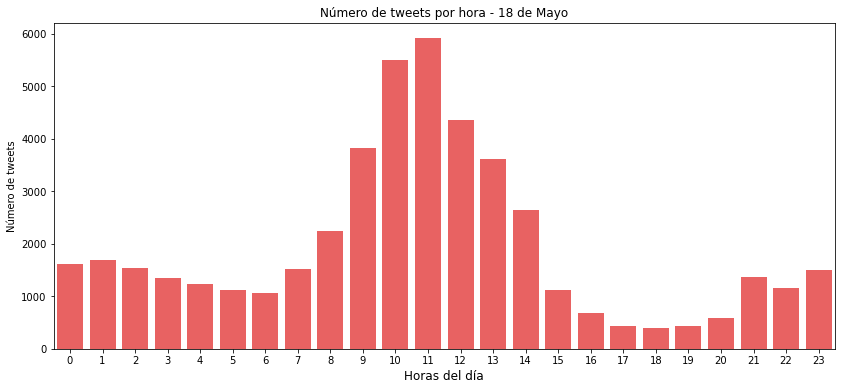

In [28]:
plt.figure(figsize=(14,6))
sns.barplot(hora.index, hora.values, alpha=0.7, color='red')
plt.xticks(rotation='horizontal')
plt.xlabel('Horas del día', fontsize=12)
plt.ylabel('Número de tweets', fontsize=10)
plt.title("Número de tweets por hora - 18 de Mayo")
plt.show()

## Hastag

In [12]:
def encontrar_hash(text):
    line=re.findall(r'(?<=#)\w+',text)
    return " ".join(line)

df['hash']=df['full_text'].apply(lambda x:encontrar_hash(x))

In [13]:
hastags=list(df[(df['hash'].notnull())&(df['hash']!="")]['hash'])
hastags = [each_string.lower() for each_string in hastags]
hash_df=dict(Counter(hastags))
top_hash_df=pd.DataFrame(list(hash_df.items()),columns = ['word','count']).sort_values('count',ascending=False)[:10]
top_hash_df

,word,count
0,auspol,25888
13,ausvotes,14495
17,auspol ausvotes,6395
91,ausvotes auspol,3003
15,auspol ausvotes2019,2496
2279,ausvotes 7news,1787
198,auspol ausvotes19,1265
26,ausvotes2019 auspol,753
239,auspol ausvotes ausvotes2019,700
704,australiadecides,623


In [14]:
fig = go.Figure(go.Bar(
    x=top_hash_df['word'],y=top_hash_df['count'],
    marker={'color': top_hash_df['count'], 
    'colorscale': 'blues'},  
    text=top_hash_df['count'],
    textposition = "outside",
))
fig.update_layout(title_text='Los 10 hastags más comunes',xaxis_title="Hashtags",
                  yaxis_title="frecuencia",template="plotly_white",height=700,title_x=0.5)
fig.show()

## Número de veces que ha publicado

In [15]:
df.user_name.value_counts().head()

💧 Sur Plus               937
PM of Australia News     464
🍌Leftie Troublemaker🍍    386
Jackie Moss ☔️           300
💧 Fierce Dinosaur        296
Name: user_name, dtype: int64

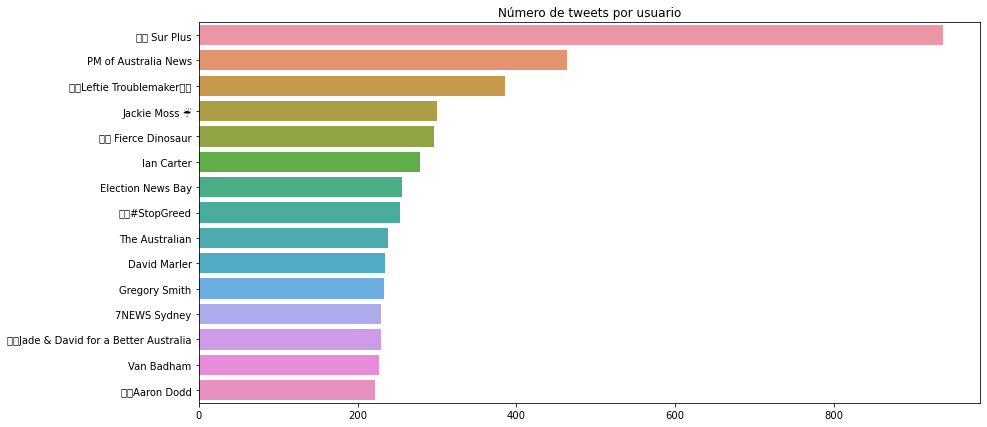

In [17]:
plt.figure(figsize=(14,7))
usuarios = df['user_name'].value_counts()
usuarios = usuarios[:15,]
sns.barplot(usuarios.values, usuarios.index,data=df)
plt.title("Número de tweets por usuario")
plt.xticks(rotation='horizontal')
plt.show()

## Ubicación de los usuarios

In [18]:
localizacion = df[['lat','long']]
localizacion.columns = localizacion.columns.str.strip()

In [27]:
import folium
from folium import plugins
from folium.plugins import HeatMap

In [28]:
mapa = folium.Map(location=[-25.274398,133.775136],zoom_start = 5)

In [29]:
heat_df = localizacion[['lat', 'long']]
heat_df = heat_df.dropna(axis=0, subset=['lat','long'])

# List comprehension para hacer una lista de listas
heat_data = [[row['lat'],row['long']] for index, row in heat_df.iterrows()]

HeatMap(heat_data).add_to(mapa)

mapa

### Gráfico de puntos

In [30]:
map_osm = folium.Map(location=[-25.274398,133.775136],zoom_start=15)

In [31]:
subset_of_df = localizacion.sample(n=1000,random_state=1)

In [32]:
some_map = folium.Map(location=[ subset_of_df['lat'].mean(),
                                 subset_of_df['long'].mean()],
                                zoom_start=10)

for row in subset_of_df.itertuples():
    some_map.add_child(folium.Marker(location=[row.lat,row.long]))

In [33]:
some_map

In [ ]:
some_map.save('C:\\Users\\ALEJANDRO\\Documents\\Segundo semestre\\') 

## Análisis de sentimiento

In [9]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
vader = SentimentIntensityAnalyzer()

df['sentiment'] = df['full_text'].apply(lambda valor: vader.polarity_scores(valor)['compound'])
df.head()

,created_at,full_text,retweet_count,favorite_count,user_name,user_description,user_location,lat,long,sentiment
0,2019-05-20 09:13:44,After the climate election: shellshocked green...,0.0,0.0,PIPELINEPETE,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",-27.469771,153.025124,0.2732
1,2019-05-20 09:12:57,It is disappointing that @tanya_plibersek has ...,0.0,0.0,Matthew Rimmer,Professor of IP & Innovation Law @QUTLaw @QUT_...,"Brisbane, Queensland",-27.469771,153.025124,-0.4404
2,2019-05-20 09:02:04,'Vote for the climate': NSW demands environmen...,0.0,0.0,PIPELINEPETE,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",-27.469771,153.025124,0.0000
3,2019-05-20 07:25:41,This is urgent! “False election claims spark p...,0.0,0.0,E Ferri,"Writer, researcher, educator in media, adverti...","Brisbane, Queensland",-27.469771,153.025124,0.6476
4,2019-05-20 07:12:01,"This is a great piece, not least because it pl...",0.0,2.0,Shahar Hameiri,Associate Professor @polsisengage @UQ_news. Po...,"Brisbane, Queensland",-27.469771,153.025124,0.6597


In [17]:
cut = pd.cut(df['sentiment'],[-np.inf, -.01, .01, np.inf],labels=['negative', 'neutral', 'positive'])
df['polarity'] = cut.values
df[['polarity','sentiment']].head()

,polarity,sentiment
0,positive,0.2732
1,negative,-0.4404
2,neutral,0.0000
3,positive,0.6476
4,positive,0.6597


In [11]:
df[['full_text', 'sentiment','polarity']].sort_values('sentiment')

,full_text,sentiment,polarity
100584,@songfestival @kaneurovision #NORWAY WON THE T...,-0.9988,negative
104385,fuck fuck fuck fuck fuck fuck fuck fuck fuck f...,-0.9987,negative
4980,Lies. Lies. Lies. Lies. Lies. Lies. Lies. Lies...,-0.9971,negative
38666,fuck fuck fuck fuck fuck fuck fuck fuck fuck f...,-0.9953,negative
89413,FACT CHECK on Coalition's adds claiming new ta...,-0.9944,negative
...,...,...,...
82768,@smh 🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣...,0.9991,positive
11134,😂💧😂💧😂💧😂💧😱💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧😂💧...,0.9992,positive
126871,#Election2019Results\n#AusVotes2019 \n#auspol ...,0.9993,positive
5445,Old mate throwing $1M on Labor with @ladbrokes...,0.9998,positive


In [12]:
print('Número de tweets negativos:' ,len(df.sentiment.loc[df.sentiment<0]))

Número de tweets negativos: 39692


In [13]:
print('Número de tweets positivos:' ,len(df.sentiment.loc[df.sentiment>0]))

Número de tweets positivos: 56277


In [14]:
print('Número de tweets neutros:' ,len(df.sentiment.loc[df.sentiment==0]))

Número de tweets neutros: 33839


Text(0, 0.5, 'Frecuencia')

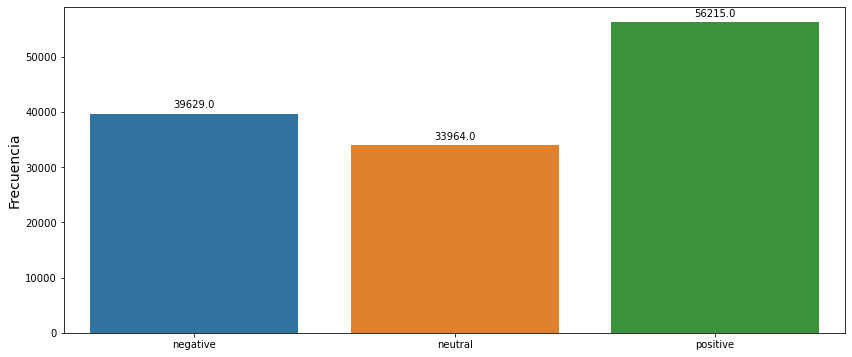

In [16]:
plt.figure(figsize=(14, 6))
polarity = df['polarity'].value_counts()
splot=sns.barplot(x=polarity.index,y=polarity.values,data=df)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.ylabel("Frecuencia", size=14)

## Nube de palabras

In [12]:
import re 
pattern1 = '?P<pic>pic.twitter.com/[^\s]+'
pattern2 = '?P<url>https?://[^\s]+'

def text_clean(row):
    text = row['full_text']
    
    links = [tuple(j for j in i if j)[-1] for i in re.findall(f"({pattern1})|({pattern2})",text)]
    for link in links:
        text = text.replace(link,"")
             
    hashtags = [interaction for interaction in text.split() if interaction.startswith("#")]
    for hashtag in hashtags:
        text = text.replace(hashtag,"")
        
    mentions = [interaction for interaction in text.split() if interaction.startswith("@")]
    for mention in mentions:
        text = text.replace(mention,"")
        
    return text, links, hashtags, mentions

In [13]:
from nltk.corpus import stopwords
stopwords_sp = stopwords.words('english')
from wordcloud import WordCloud

def pre_procesado(texto):
    texto = texto.lower()
    texto = re.sub(r"[\W\d_]+", " ", texto)
    texto = " ".join([palabra for palabra in texto.split() if palabra not in stopwords_sp])
    return texto

In [15]:
df[['clean', 'links', 'hashtags', 'mentions']] = df.apply(text_clean, axis=1, result_type='expand')

In [16]:
df['pp'] = df['clean'].apply(lambda texto: pre_procesado(texto))

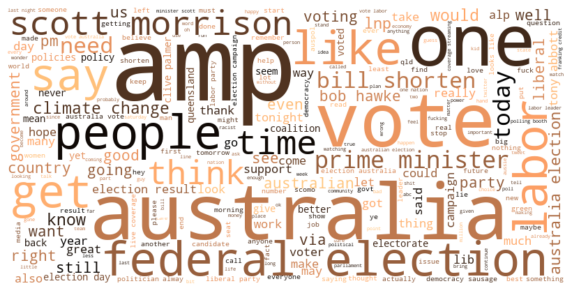

In [61]:
palabras = df.pp.str.cat(sep=" ")
wordcloud = WordCloud(width=800, height=400,
                     max_font_size=150, max_words=250,
                     background_color='white', colormap='copper_r',
                     stopwords=stopwords_sp,).generate(palabras)

plt.figure(figsize=(10,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

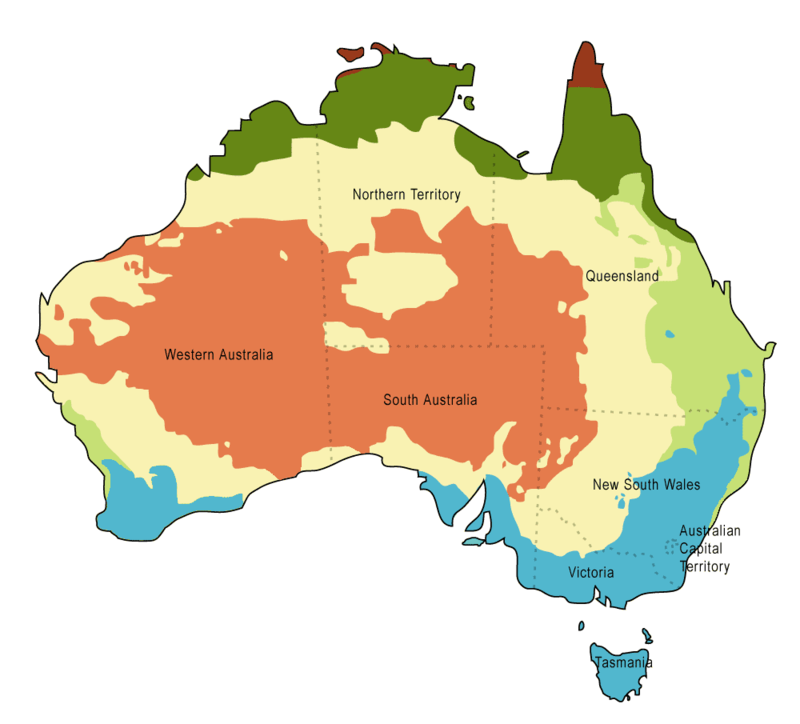

In [13]:
import PIL.Image
australia = PIL.Image.open('australiaMapa.png')
display(australia)

In [14]:
mask = np.array(australia)

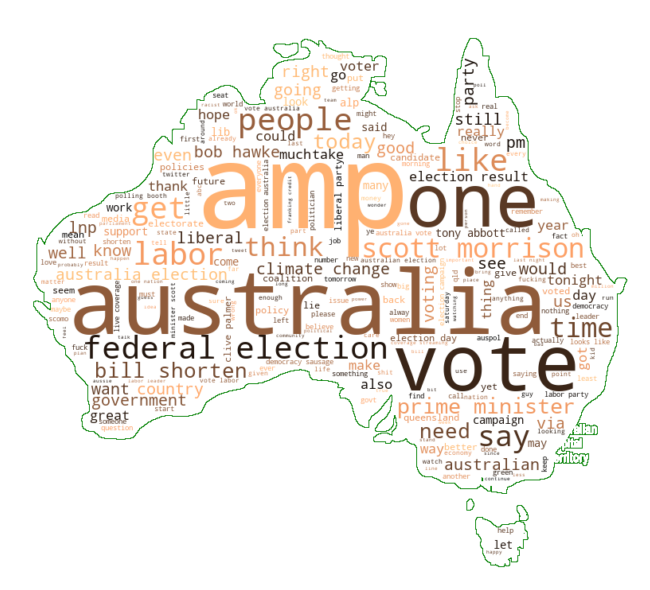

In [15]:
palabras = df.pp.str.cat(sep=" ")
wordcloud = WordCloud(width=800, height=400,
                     max_font_size=150, max_words=250,
                     background_color='white', colormap='copper_r',
                     stopwords=stopwords_sp,
                     mask=mask, contour_width=0.5, contour_color='green').generate(palabras) # https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html

#wordcloud.to_file("australia.jpg")

plt.figure(figsize=(10,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()


### Nube de palabras con sentimiento negativo

In [29]:
negativo=df.loc[df.sentiment<0]
negativo = negativo.copy()

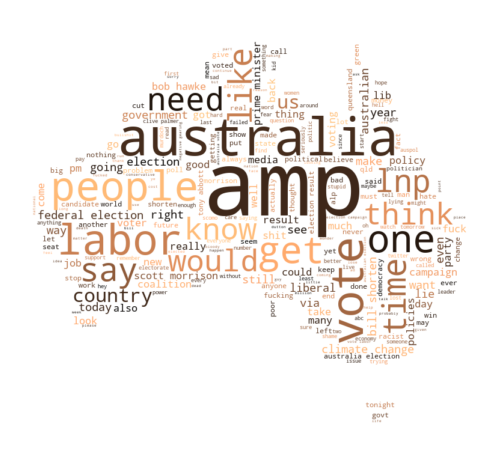

In [28]:
palabras = negativo.pp.str.cat(sep=" ")
wordcloud = WordCloud(width=800, height=400,
                     max_font_size=150, max_words=250,
                     background_color='white', colormap='copper_r', mask=mask,
                     stopwords=stopwords_sp,).generate(palabras)

plt.figure(figsize=(10,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

### Nube de palabras con sentimiento positivo

In [30]:
positivo=df.loc[df.sentiment<0]
positivo = positivo.copy()

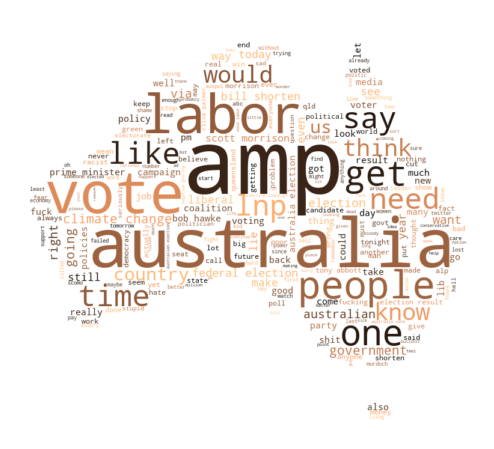

In [31]:
palabras = positivo.pp.str.cat(sep=" ")
wordcloud = WordCloud(width=800, height=400,
                     max_font_size=150, max_words=250,
                     background_color='white', colormap='copper_r', mask=mask,
                     stopwords=stopwords_sp,).generate(palabras)

plt.figure(figsize=(10,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.show()

### Palabras comunes

# Modelo LDA

In [19]:
import pyLDAvis.gensim
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from pprint import pprint

In [33]:
def pre_procesado1(texto):
    texto = texto.lower()
    texto = re.sub(r"[\W\d_]+", " ", texto)
    texto = [palabra for palabra in texto.split() if palabra not in stopwords_sp]
    return texto


In [34]:
df['pre_procesado'] = df['full_text'].apply(lambda texto: pre_procesado1(texto))

In [35]:
df.head()

,created_at,full_text,retweet_count,favorite_count,user_name,user_description,user_location,lat,long,hash,clean,links,hashtags,mentions,pp,pre_procesado
0,2019-05-20 09:13:44,After the climate election: shellshocked green...,0.0,0.0,PIPELINEPETE,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",-27.469771,153.025124,,After the climate election: shellshocked green...,[https://t.co/wyJzmAcyiD],[],[],climate election shellshocked green groups rem...,"[climate, election, shellshocked, green, group..."
1,2019-05-20 09:12:57,It is disappointing that @tanya_plibersek has ...,0.0,0.0,Matthew Rimmer,Professor of IP & Innovation Law @QUTLaw @QUT_...,"Brisbane, Queensland",-27.469771,153.025124,auspol,It is disappointing that has ruled herself ou...,[https://t.co/n1DaiVRRF7],[#auspol],"[@tanya_plibersek, @AustralianLabor]",disappointing ruled leadership challenge given...,"[disappointing, tanya, plibersek, ruled, austr..."
2,2019-05-20 09:02:04,'Vote for the climate': NSW demands environmen...,0.0,0.0,PIPELINEPETE,Retired Tradesman and Progressive Anti Conserv...,"Brisbane, Queensland",-27.469771,153.025124,,'Vote for the climate': NSW demands environmen...,[https://t.co/VrFvB0vyJ4],[],[],vote climate nsw demands environmental short f...,"[vote, climate, nsw, demands, environmental, s..."
3,2019-05-20 07:25:41,This is urgent! “False election claims spark p...,0.0,0.0,E Ferri,"Writer, researcher, educator in media, adverti...","Brisbane, Queensland",-27.469771,153.025124,,This is urgent! “False election claims spark p...,[https://t.co/iabJ3b8FAO],[],[],urgent false election claims spark push truth ...,"[urgent, false, election, claims, spark, push,..."
4,2019-05-20 07:12:01,"This is a great piece, not least because it pl...",0.0,2.0,Shahar Hameiri,Associate Professor @polsisengage @UQ_news. Po...,"Brisbane, Queensland",-27.469771,153.025124,,"This is a great piece, not least because it pl...",[https://t.co/TEzbOavWEs],[],[],great piece least places last elections contex...,"[great, piece, least, places, last, elections,..."


In [36]:
# Crear una representación de los documentos en forma de diccionario
dictionary = Dictionary(df['pre_procesado'].values)

In [39]:
# Filtrar palabras muy frecuentes o infrecuentes
dictionary.filter_extremes(no_below=5, no_above=0.5)

corpus = [dictionary.doc2bow(text) for text in df['pre_procesado'].values]

In [40]:
# Train the topic model
model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=7, passes=4)

In [41]:
model.print_topics(num_words=10)

[(0,
  '0.104*"ausvotes" + 0.015*"abbott" + 0.013*"tony" + 0.009*"scottmorrisonmp" + 0.008*"scomo" + 0.008*"australiadecides" + 0.007*"abcnews" + 0.007*"ausvote" + 0.006*"morrison" + 0.006*"tonyabbottmhr"'),
 (1,
  '0.079*"ausvotes" + 0.035*"vote" + 0.020*"australia" + 0.019*"election" + 0.017*"day" + 0.016*"democracy" + 0.015*"democracysausage" + 0.015*"australiavotes" + 0.013*"voting" + 0.012*"today"'),
 (2,
  '0.026*"amp" + 0.014*"ausvotes" + 0.012*"tax" + 0.012*"labor" + 0.008*"lnp" + 0.006*"murdoch" + 0.006*"media" + 0.006*"australianlabor" + 0.006*"public" + 0.005*"abc"'),
 (3,
  '0.043*"ausvotes" + 0.018*"bob" + 0.017*"hawke" + 0.014*"news" + 0.009*"pm" + 0.008*"live" + 0.008*"barnaby" + 0.007*"coverage" + 0.007*"australian" + 0.006*"amp"'),
 (4,
  '0.038*"ausvotes" + 0.015*"like" + 0.014*"people" + 0.010*"get" + 0.009*"amp" + 0.009*"time" + 0.008*"australia" + 0.007*"know" + 0.007*"change" + 0.007*"one"'),
 (5,
  '0.076*"election" + 0.041*"australia" + 0.022*"shorten" + 0.020*"

In [42]:
import pyLDAvis.gensim
lda_display = pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=True)
pyLDAvis.display(lda_display)

In [52]:
d = dictionary.doc2bow(["vote", "shorten", "morrinson", "australia"])
topics = model.get_document_topics(d)
topics

[(0, 0.035714563),
 (1, 0.29006842),
 (2, 0.035743736),
 (3, 0.035725206),
 (4, 0.035764292),
 (5, 0.5311984),
 (6, 0.03578546)]

In [53]:
def get_doc_top_n(text_processed, n):
    d = dictionary.doc2bow(text_processed)
    topics = dict(model.get_document_topics(d))
    try:
        return topic[n]
    except:
        return None
    
get_doc_top_n(["vote", "shorten", "morrinson", "australia"],1) 

In [54]:
for t in range(0,7):
    top_name = f"topic_{t}"
    df[top_name] = df['pre_procesado'].apply(lambda doc: get_doc_top_n(doc,t))

In [56]:
for t in range(0,7):
    print(f"****************************** TOPIC {t} ******************************")
    for i,row in enumerate(df.sort_values(f"topic_{t}", ascending=False)['full_text'].head()):
        print(f"tweet #{i+1}")
        print(row[:500])
        print()
    print()

****************************** TOPIC 0 ******************************
tweet #1
After the climate election: shellshocked green groups remain resolute https://t.co/wyJzmAcyiD

tweet #2
It is disappointing that @tanya_plibersek has ruled herself out of the @AustralianLabor leadership challenge - given her qualities https://t.co/n1DaiVRRF7 #auspol

tweet #3
'Vote for the climate': NSW demands environmental short film's removal from internet https://t.co/VrFvB0vyJ4

tweet #4
This is urgent! “False election claims spark push for truth in political advertising laws” https://t.co/iabJ3b8FAO

tweet #5
This is a great piece, not least because it places the last few elections in their context. What we're seeing play out now in Australian politics is the slow and ugly dissolution of politics of the industrial era and its stable 2-party structure https://t.co/TEzbOavWEs


****************************** TOPIC 1 ******************************
tweet #1
After the climate election: shellshocked green gr

## k-means

In [38]:
df_muestra = df.sample(n=500, random_state=1)

In [39]:
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

def pre_procesado2(texto):
    texto = texto.lower()
    texto = re.sub(r"[\W\d_]+", " ", texto)
    return texto

tfidf_vect = TfidfVectorizer(preprocessor=pre_procesado2)
tfidf = tfidf_vect.fit_transform(df_muestra.full_text.values)
tfidf_matrix = pd.DataFrame(tfidf.toarray(), columns=tfidf_vect.get_feature_names())

In [34]:
# Escogiendo el K nodo
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

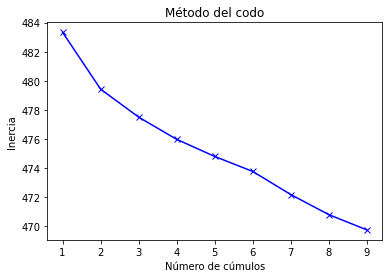

In [40]:
ks = []
kinertia = []

for k in range(1,10):
    kmeans = KMeans(n_clusters=k).fit(tfidf_matrix)
    ks.append(k)
    kinertia.append(kmeans.inertia_)
    
plt.xlabel("Número de cúmulos"); 
plt.ylabel("Inercia");
plt.title('Método del codo')
plt.plot(ks,kinertia, 'bx-');

In [41]:
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

k_pt = 4
model = KMeans(n_clusters=k_pt)
model.fit(tfidf_matrix)
nbrs = NearestNeighbors(n_neighbors=3, metric='euclidean').fit(tfidf_matrix.values)

df_muestra['cluster'] = model.labels_
clust_cnt = df_muestra['cluster'].value_counts()
clust_cnt_pct = df_muestra['cluster'].value_counts(normalize=True)

print(f"{color.BOLD}CLUSTERS:\n{color.END}")
centroids = model.cluster_centers_
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = tfidf_vect.get_feature_names()

for i in range(k_pt):
    print(f"{color.BLUE}Cluster {i}:{color.END}")
    print(f"{color.CYAN}COUNT {color.END} {clust_cnt[i]} comments ({clust_cnt_pct[i]:.2%} of the data)")
    print(f"{color.CYAN}TERMS {color.END}", end=" ")
    for ind in order_centroids[i, :20]:
        print(f'{color.BOLD}{terms[ind]}{color.END}', end=" "),
    print(f"\n{color.CYAN}REPRESENTATIVE COMMENTS{color.END}")
    for comment in df_muestra.iloc[nbrs.kneighbors([centroids[i]])[1][0]]['full_text'].values:
        print(f"* {comment}")
    print("\n")

CLUSTERS:

Cluster 0:
COUNT  63 comments (12.60% of the data)
TERMS  vote for and in australia to the ausvotes you our co https it election of get auspol party about are 
REPRESENTATIVE COMMENTS
* Voting in Australia is done so well. It’s on a Saturday and you can vote early if you’re busy. The lines go quickly and there’s almost always a bbq going with a little stall for the school hosting the ballots. In and out in 5 minutes and scored a $2 #democracysausage #AUSVote19
* A message for @ScottMorrisonMP 

We do NOT vote for the position of Prime Minister of this country. We vote for our local Members of Parliament. You need to go back and learn how democracy works. #auspol #ausvotes #AusVotes19
* One thing we do get right is how easy it is to vote in Australia. On a weekend, I had no line and was done in a few mins. #ausvotes


Cluster 1:
COUNT  122 comments (24.40% of the data)
TERMS  co https ausvotes election auspol the australia at news live in of you to shorten and for is as morri

In [42]:
clusters = {0:'finalizacion',
            1:'hashtags',
            2:'Malas_palabras',
            3:'parlamento_local'}

df_muestra['cluster'] = df_muestra['cluster'].apply(lambda val: clusters[val])
df_muestra.sample(2)

,created_at,full_text,retweet_count,favorite_count,user_name,user_description,user_location,lat,long,hash,cluster
11446,2019-05-18 13:39:49,"Shorten: ""I'm confident victory will come at t...",0.0,6.0,The New Daily,Freeing the #news since 2013.,Australia,-25.274398,133.775136,ausvotes auspol,hashtags
45573,2019-05-19 07:38:51,"No mention of Netherlands. Iceland, Norway and...",0.0,2.0,Andy Horton,“What am I? I'm an academic librarian with a t...,London,51.507351,-0.127758,,finalizacion


In [43]:
df_centroides = pd.DataFrame(model.cluster_centers_)
df_centroides['cluster'] = clusters.values()
df_centroides

,0,1,2,3,4,5,6,7,8,9,...,3574,3575,3576,3577,3578,3579,3580,3581,3582,cluster
0,3.252607e-19,1.084202e-19,-1.734723e-18,8.673617e-19,0.000000,0.000000e+00,-3.469447e-18,0.000000,5.421011e-20,3.252607e-19,...,5.294580e-03,-2.168404e-19,-1.084202e-19,-1.084202e-19,-3.252607e-19,4.336809e-19,-3.252607e-19,0.00000,0.000000e+00,finalizacion
1,5.421011e-19,1.192622e-18,3.563546e-03,4.978464e-03,0.000000,2.284852e-03,1.657285e-03,0.000000,-3.794708e-19,4.336809e-19,...,-4.336809e-19,3.215698e-03,2.168404e-19,2.599481e-03,2.351698e-03,2.808447e-03,-8.673617e-19,0.00137,2.121900e-03,hashtags
2,1.165737e-03,1.139425e-03,9.021758e-03,9.304900e-03,0.001592,5.421011e-19,1.229954e-02,0.001592,1.135716e-03,2.109392e-03,...,-5.421011e-19,1.301043e-18,4.878910e-19,6.505213e-19,5.421011e-19,-1.084202e-18,4.336809e-19,0.00000,-6.505213e-19,Malas_palabras
3,6.505213e-19,1.525593e-03,5.436310e-03,1.968186e-03,0.000000,2.168404e-19,2.275758e-03,0.000000,-4.878910e-19,4.336809e-19,...,-4.336809e-19,1.192622e-18,1.487491e-03,4.336809e-19,2.168404e-19,-7.589415e-19,3.134905e-03,0.00000,-4.336809e-19,parlamento_local


In [44]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.offline import iplot

In [46]:
pca = PCA(n_components=2)

result = pca.fit_transform(tfidf_matrix)
result = pd.DataFrame(result)
result.columns = ['X', 'Y']
result['cluster'] = df_muestra.cluster.values
result['texto'] = df_muestra.full_text.apply(lambda val: val[:140])


colorsIdx = {'finalizacion': 'blue',
             'hashtags': 'yellow',
             'Malas_palabras': 'green',
             'parlamento_local': 'red'}

cols = df_muestra['cluster'].map(colorsIdx)

trace = go.Scatter(x=result['X'].values,
                   y=result['Y'].values,
                   text=result['texto'].values,
                   mode='markers',
                   marker=dict(color=cols)) 

layout = go.Layout(title="PCA")

fig = go.Figure(data=trace, layout=layout)
iplot(fig)